## 1) Загрузка данных и визуализация

In [1]:
from pathlib import Path

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline


In [2]:
try:
    import ydata_profiling
except ImportError:
    !pip install ydata-profiling

In [2]:
df_total = pd.read_csv('D:\\SKILLBOX\\DA Junior\\FINAL\\Data\\df_total.csv')
df_total.head()

,id,gender,age,education,city,country,lbt_coef,ac_coef,sm_coef,personal_coef,product,colour,cost,product_sex,base_sale,dt,categories
0,0,0.0,36,среднее,1201,32,5.078678,-0.307147,0.959027,0.5072,велосипед горный,белый,13599,0.0,1,7,bike
1,0,0.0,36,среднее,1201,32,5.078678,-0.307147,0.959027,0.5072,стол,зелёный,1499,2.0,0,37,hike
2,0,0.0,36,среднее,1201,32,5.078678,-0.307147,0.959027,0.5072,набор,бежевый,4799,2.0,0,37,hike
3,3,NaN,31,среднее,1134,32,7.764766,-0.030225,0.794720,0.4304,бутсы,белый,1599,1.0,0,13,shoes
4,3,NaN,31,среднее,1134,32,7.764766,-0.030225,0.794720,0.4304,мяч футбольный,мультицвет,7199,2.0,0,27,sports_goods


In [4]:
from ydata_profiling import ProfileReport
profile = ProfileReport(
        df_total, title="Profile Report of Sportswear shop Dataset", explorative=True
    )

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

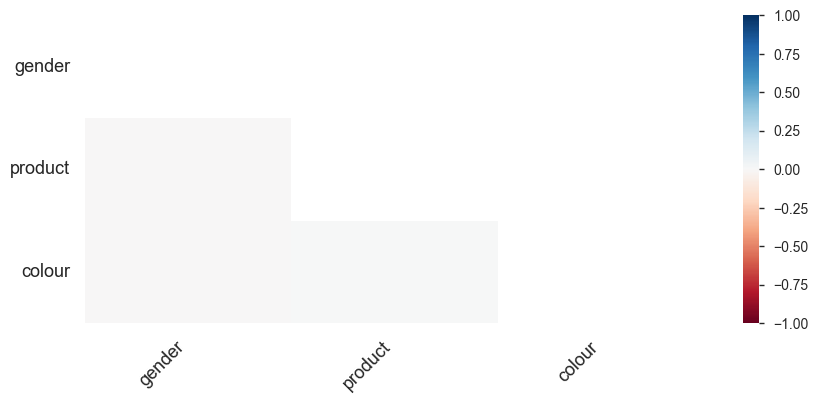

In [5]:
profile

Histogram for colour


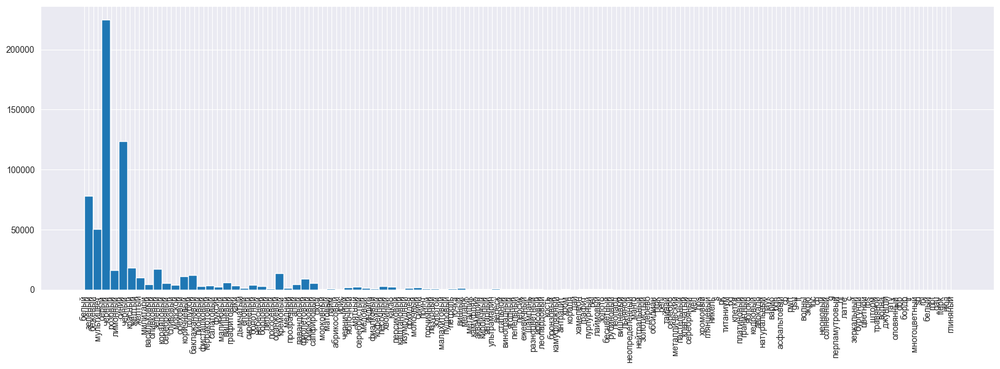

In [6]:
plt.figure(figsize=(20, 6))  # Устанавливаем размер графика
plt.xticks(rotation=90)  # Поворачиваем значения оси X на 90 градусов
print(f'Histogram for colour')
df_total['colour'].hist(bins=100)
plt.show()

In [7]:
def calculate_outliers(data): #функция для нахождения границ
    q25 = data.quantile(0.25)
    q75 = data.quantile(0.75)
    iqr = q75 - q25
    boundaries = (q25 - 1.5 * iqr, q75 + 1.5 * iqr)

    return boundaries

boundaries = calculate_outliers(df_total['cost'])
#Cчитаем и выводим количество выбросов в доходе.
is_outlier = (df_total['cost'] < boundaries[0]) | (df_total['cost'] > boundaries[1])
print('cost = ', is_outlier.sum(), 
      'граница нижняя -', boundaries[0], 'граница верхняя -', boundaries[1])
df_cp = df_total[is_outlier].sort_values(by='cost')
df_cp
# С аномалиями ничего делать не буду, так это реальные товары и покупают их не один раз
# А в стоимости есть отрицательные значения


cost =  71230 граница нижняя - -4651.0 граница верхняя - 11749.0


,id,gender,age,education,city,country,lbt_coef,ac_coef,sm_coef,personal_coef,product,colour,cost,product_sex,base_sale,dt,categories
368103,84458,1.0,46,среднее,1157,32,8.222184,0.321750,1.310283,0.4304,спиннинговое удилище,коричневый,11750,2.0,0,26,other
433561,99403,1.0,52,среднее,1187,32,8.448383,-0.230950,1.132756,0.4304,спиннинговое удилище,коричневый,11750,2.0,0,27,other
597895,136430,0.0,37,среднее,1188,32,5.141718,0.056436,1.389928,0.5072,спиннинговое удилище,коричневый,11750,2.0,0,25,other
67075,15225,1.0,37,среднее,1134,32,7.435198,0.407640,0.620201,0.4304,кроссовки,черный,11759,1.0,1,19,shoes
773961,176653,1.0,44,среднее,1134,32,8.073822,0.123288,1.368386,0.4304,кроссовки,NaN,11759,1.0,0,13,shoes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23301,5319,1.0,46,среднее,1208,32,7.932733,0.247284,0.675700,0.4304,other,NaN,446420,2.0,0,45,other
217290,49636,NaN,37,среднее,1145,32,5.380332,0.222337,1.189571,0.5072,other,NaN,446420,2.0,0,40,other
756890,172831,1.0,18,высшее,1194,32,7.264319,0.638112,0.799480,0.2672,other,NaN,446420,2.0,0,31,other
271728,62409,1.0,37,высшее,1203,32,7.691185,-0.110834,1.341414,0.4688,other,NaN,446420,2.0,0,52,other


In [4]:
df_total[df_total['cost'] < 0]

,id,gender,age,education,city,country,lbt_coef,ac_coef,sm_coef,personal_coef,product,colour,cost,product_sex,base_sale,dt,categories
126853,28660,0.0,22,высшее,1182,32,5.085366,0.486641,0.685291,0.5584,other,NaN,-30,0.0,0,2,other
126861,28660,0.0,22,высшее,1182,32,5.085366,0.486641,0.685291,0.5584,other,NaN,-30,0.0,0,3,other
685526,156357,1.0,43,среднее,1188,32,7.659427,0.405222,0.880676,0.4304,other,NaN,-30,0.0,0,37,other
693598,158185,NaN,36,среднее,1134,32,4.838949,-0.040589,1.192344,0.5072,other,NaN,-30,0.0,0,23,other


In [3]:
# предположу, что минус лишний
df_total['cost']  = df_total['cost'] .apply(lambda x: abs(x) if x < 0 else x)

In [4]:
df_total[df_total['cost'] < 0]

,id,gender,age,education,city,country,lbt_coef,ac_coef,sm_coef,personal_coef,product,colour,cost,product_sex,base_sale,dt,categories


In [5]:
# Заполню пропуски в colour наиболее частым значением - черный, но так как их 190, 
# и этот признак по логике должен сильно коррелировать с полом продукта и полом клиента, 
# то в модели не буду использовать.
df_total['colour'] = df_total['colour'].fillna('черный')

In [6]:
df_total['product'] = df_total['product'].fillna('other')

In [7]:
df_total.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 780117 entries, 0 to 780116
Data columns (total 17 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   id             780117 non-null  int64  
 1   gender         664665 non-null  float64
 2   age            780117 non-null  int64  
 3   education      780117 non-null  object 
 4   city           780117 non-null  int64  
 5   country        780117 non-null  int64  
 6   lbt_coef       780117 non-null  float64
 7   ac_coef        780117 non-null  float64
 8   sm_coef        780117 non-null  float64
 9   personal_coef  780117 non-null  float64
 10  product        780117 non-null  object 
 11  colour         780117 non-null  object 
 12  cost           780117 non-null  int64  
 13  product_sex    780117 non-null  float64
 14  base_sale      780117 non-null  int64  
 15  dt             780117 non-null  int64  
 16  categories     780117 non-null  object 
dtypes: float64(6), int64(7), obje

In [11]:
df_total.to_csv('D:\SKILLBOX\DA Junior\FINAL\Data\df_total_2.csv', index=False)

<>:1: SyntaxWarning: invalid escape sequence '\S'
<>:1: SyntaxWarning: invalid escape sequence '\S'
C:\Users\semen\AppData\Local\Temp\ipykernel_3960\1073400921.py:1: SyntaxWarning: invalid escape sequence '\S'
  df_total.to_csv('D:\SKILLBOX\DA Junior\FINAL\Data\df_total_2.csv', index=False)


## 2) Создание пайплайна для предсказания пола клиента

In [2]:
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder

In [3]:
df_total = pd.read_csv('D:\\SKILLBOX\\DA Junior\\FINAL\\Data\\df_total_2.csv')

In [8]:
cols_to_drop = ['country', 'lbt_coef', 'ac_coef', 'sm_coef', 'product', 'colour' ]

In [9]:
df_total = df_total.drop(columns = cols_to_drop)
df_total.head()

,id,gender,age,education,city,personal_coef,cost,product_sex,base_sale,dt,categories
0,0,0.0,36,среднее,1201,0.5072,13599,0.0,1,7,bike
1,0,0.0,36,среднее,1201,0.5072,1499,2.0,0,37,hike
2,0,0.0,36,среднее,1201,0.5072,4799,2.0,0,37,hike
3,3,NaN,31,среднее,1134,0.4304,1599,1.0,0,13,shoes
4,3,NaN,31,среднее,1134,0.4304,7199,2.0,0,27,sports_goods


In [6]:
# Делю датасет на 2, один без пропусков в gender, второй с пропусками
df_full = df_total[df_total['gender'].notnull()]
df_nan = df_total[df_total['gender'].isnull()] 
print('Количество заполненных id = ', len(df_full), '\nКоличество пропущенных id = ', len(df_nan))

Количество заполненных id =  664665 
Количество пропущенных id =  115452


In [7]:
# Баланс ЦП нормальный
df_full['gender'].value_counts()

gender
1.0    368757
0.0    295908
Name: count, dtype: int64

In [8]:
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
import numpy as np

RANDOM_SEED = 42

data_train, data_test = train_test_split(df_full, test_size=0.2, random_state=RANDOM_SEED)

In [9]:
target = ['gender']
numerical_features = ['age', 'personal_coef',  'cost', 'dt']
categorial_features = ['education',  'product_sex', 'city', 'categories']

In [10]:
X_train, y_train = data_train.drop(columns = target), data_train[target]
X_test, y_test = data_test.drop(columns = target), data_test[target]

In [11]:
kfold = KFold(n_splits=4, shuffle=True, random_state=RANDOM_SEED)

In [12]:
numerical_transformer = Pipeline(steps=[
    ("scaler", StandardScaler())])

cat_transformer = Pipeline(steps=[
        ('encoder', OneHotEncoder(handle_unknown='ignore', min_frequency=5000, sparse_output=True))
    ])

data_transformer = ColumnTransformer(transformers=[
    ("numerical", numerical_transformer, numerical_features),
    ("categorial", cat_transformer, categorial_features)
])

preprocessor = Pipeline(steps=[("data_transformer", data_transformer)])

#### Пайплайн для XGBClassifier

In [13]:
from xgboost import XGBClassifier
from sklearn.model_selection import cross_val_score, cross_validate
xgb_model = XGBClassifier() 
XGBClassifier_pipline = Pipeline(
    steps=[("preprocessor", preprocessor), 
           ("classifier", XGBClassifier())])

score = cross_validate(XGBClassifier_pipline, X_train, y_train, cv=kfold, scoring='f1')
#print(f'model: {type(XGBClassifier).__name__}, f1_mean: {score.mean():.4f}, f1_std: {score.std():.4f}')
print(f"model: {type(XGBClassifier).__name__}, f1_mean: {score['test_score'].mean():.4f}, \
    roc_auc_std: {score['test_score'].std():.4f},\
    info: {score}")

model: type, f1_mean: 1.0000,     roc_auc_std: 0.0000,    info: {'fit_time': array([1.4082334 , 1.14399219, 1.19590759, 1.194664  ]), 'score_time': array([0.1875    , 0.16133595, 0.16163039, 0.16635466]), 'test_score': array([1., 1., 1., 1.])}


#### Так как на всех фолдах 1, std = 0, можно сделать вывод, что модель прекрасно предсказывает пол

In [14]:
from sklearn.metrics import f1_score
XGBClassifier_pipline.fit(X_train, y_train)
preds = XGBClassifier_pipline.predict(X_test)

print('f1_score=',f1_score(y_test, preds))


f1_score= 1.0


In [15]:
# Собираю датасет с id и предсказанным gender
preds_gender = XGBClassifier_pipline.predict(df_nan.drop(columns = target))
df_preds = pd.DataFrame(data = {
    'id' : df_nan['id'],
    'flag' : preds_gender    
})
df_preds

,id,flag
3,3,1
4,3,1
5,3,1
6,3,1
128,33,1
...,...,...
780044,177984,0
780045,177984,0
780106,178002,1
780107,178002,1


In [78]:
df_preds.to_csv('D:\\SKILLBOX\\DA Junior\\FINAL\\Data\\df_preds_2.csv')
#df_total.to_csv('D:\SKILLBOX\DA Junior\FINAL\Data\df_total_2.csv', index=False)

In [23]:
# Добавляю предсказания в датасет
merged_df = df_total.join(df_preds, rsuffix='_preds')

merged_df['gender'].fillna(merged_df['flag'], inplace=True)

merged_df.drop(['flag','id_preds'] , axis=1, inplace=True)

C:\Users\semen\AppData\Local\Temp\ipykernel_9528\3600419112.py:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  merged_df['gender'].fillna(merged_df['flag'], inplace=True)


In [24]:
merged_df

,id,gender,age,education,city,personal_coef,cost,product_sex,base_sale,dt,categories
0,0,0.0,36,среднее,1201,0.5072,13599,0.0,1,7,bike
1,0,0.0,36,среднее,1201,0.5072,1499,2.0,0,37,hike
2,0,0.0,36,среднее,1201,0.5072,4799,2.0,0,37,hike
3,3,1.0,31,среднее,1134,0.4304,1599,1.0,0,13,shoes
4,3,1.0,31,среднее,1134,0.4304,7199,2.0,0,27,sports_goods
...,...,...,...,...,...,...,...,...,...,...,...
780112,178004,1.0,52,высшее,1188,0.4688,7999,1.0,0,12,shoes
780113,178004,1.0,52,высшее,1188,0.4688,24299,1.0,0,13,shoes
780114,178004,1.0,52,высшее,1188,0.4688,24299,1.0,0,20,shoes
780115,178004,1.0,52,высшее,1188,0.4688,12,2.0,0,20,other


In [25]:
merged_df.shape

(780117, 11)

In [26]:
merged_df.to_csv('D:\\SKILLBOX\\DA Junior\\FINAL\\Data\\df_full_2.csv')

In [10]:
merged_df = pd.read_csv('D:\\SKILLBOX\\DA Junior\\FINAL\\Data\\df_full_2.csv')

In [21]:
merged_df['categories'] = merged_df['categories'].apply(lambda x: 
    'cloth' if x in ['outerwear', 'wear', 'headdress', 'underwear', 'swiming']
    else ('sports_goods' if x in ['sports_goods', 'Multigym','bike']
    else ('accessory' if x in ['bags', 'headdress', 'accessory']
    else x)))


In [23]:
# Объединяю товары для девочек, мальчиков и юношей в одну группу
merged_df['product_sex'] = merged_df['product_sex'].apply(lambda x: 
    3 if x in [3, 4, 5] else x)

In [25]:
merged_df.to_csv('D:\\SKILLBOX\\DA Junior\\FINAL\\Data\\df_full_min.csv')